## BASIC ROUTE MAPPING


## 1.Data Preprocessing

### Step 1 Loading Dataset 

In [1]:
import pandas as pd  

# Load dataset
file_path = r"C:\Users\knive\OneDrive\Desktop\Sem 4\Capstone B\Fixed_cleaned_activities (1).csv"  # Use 'r' to avoid path errors
df = pd.read_csv(file_path)

# Display first few rows
df.head()


,Activity ID,Activity Type,Begin Timestamp,End Timestamp,Max. Elevation (Raw),Min. Elevation (Raw),Elevation Gain (Raw),Elevation Loss (Raw),Average Heart Rate (bpm),Min. Heart Rate (bpm),...,Wind Speed (Raw),Wind Direction,Humidity (Raw),Condition,Rainfall,Duration (seconds),Moving Duration (seconds),GPX Min Heart Rate,Max. Heart Rate (bpm),Average Cadence
0,1199436564,Running,01-01-2015 03:34,05-06-2016 12:48,260.36,246.600006,5.88,18.73,172.698166,100.334768,...,10,N,65,fair,no,1901,2094296,NaN,191.833686,78.659341
1,908332579,Running,24-09-2015 12:55,24-09-2015 13:16,307.23,247.000000,62.46,64.20,186.000000,115.000000,...,8,WSW,59,mostly clear,no,1275,1275,115.0,201.000000,76.747191
2,912662907,Running,28-09-2015 17:19,28-09-2015 17:39,308.37,247.000000,52.29,55.11,174.000000,70.000000,...,21,O,34,fair,no,1232,1227,70.0,199.000000,76.079365
3,1203784563,Running,07-06-2016 09:10,07-06-2016 09:42,309.47,245.399994,70.94,73.86,175.139734,99.560322,...,2,N,73,fair,no,1903,1880,NaN,194.162504,77.991701
4,1205026379,Running,09-06-2016 14:56,09-06-2016 15:17,308.59,247.000000,67.47,69.46,179.201851,100.011382,...,14,N,53,mostly clear,no,1270,1260,NaN,198.932464,77.173410


-  Loaded dataset successfully and displayed the first few rows. 

#### Checking for structure 

In [2]:
df.info()  # Shows column names, data types, and missing values


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 33 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Activity ID                            155 non-null    int64  
 1   Activity Type                          155 non-null    object 
 2   Begin Timestamp                        155 non-null    object 
 3   End Timestamp                          155 non-null    object 
 4   Max. Elevation (Raw)                   155 non-null    float64
 5   Min. Elevation (Raw)                   155 non-null    float64
 6   Elevation Gain (Raw)                   155 non-null    float64
 7   Elevation Loss (Raw)                   155 non-null    float64
 8   Average Heart Rate (bpm)               155 non-null    float64
 9   Min. Heart Rate (bpm)                  155 non-null    float64
 10  Average Moving Speed                   155 non-null    float64
 11  Averag

Here’s what we found from  dataset structure:

-  Timestamps (Begin Timestamp, End Timestamp) are in object (string) format
    -  We need to convert them to datetime format for proper calculations.

-  Duration columns (Duration (h:m:s), Moving Duration (h:m:s)) are also object
    -  Convert these to seconds or timedelta format for analysis.

-  Missing values in GPX Min Heart Rate (only 91 out of 155 rows are filled)
    -  Check how we handle missing heart rate values (drop, fill, or ignore).

### Step 2 Checking for Missing values 

In [3]:
# Check for missing values
missing_values = df.isnull().sum()
missing_values[missing_values > 0]  # Display only columns with missing values


GPX Min Heart Rate    64
dtype: int64

*  The only column with missing values is GPX Min Heart Rate, with 64 missing entries.

### Step 3 Convert Timestamps to Datetime Format

In [4]:
# Convert timestamps to datetime format
df['Begin Timestamp'] = pd.to_datetime(df['Begin Timestamp'], format='%d-%m-%Y %H:%M')
df['End Timestamp'] = pd.to_datetime(df['End Timestamp'], format='%d-%m-%Y %H:%M')

# Check if conversion is successful
df[['Begin Timestamp', 'End Timestamp']].head()


,Begin Timestamp,End Timestamp
0,2015-01-01 03:34:00,2016-06-05 12:48:00
1,2015-09-24 12:55:00,2015-09-24 13:16:00
2,2015-09-28 17:19:00,2015-09-28 17:39:00
3,2016-06-07 09:10:00,2016-06-07 09:42:00
4,2016-06-09 14:56:00,2016-06-09 15:17:00


* The timestamps have been successfully converted to a consistent datetime format. 

### Step 4 Clean and Correct Erroneous GPS Data

-  Now, we will focus on cleaning the GPS data (latitude and longitude) to ensure there are no erroneous or outlier values that could skew the analysis.

    -  First, we will visualize the range of latitude and longitude values to check if any values seem unrealistic or out of bounds.

    -  We will handle any outliers by filtering out GPS coordinates that are too extreme (e.g., latitudes greater than 90 or less than -90, longitudes greater than 180 or less than -180).

In [5]:
# Check the range of latitude and longitude
lat_range = df[['Begin Latitude (Decimal Degrees Raw)', 'End Latitude (Decimal Degrees Raw)']].describe()
lon_range = df[['Begin Longitude (Decimal Degrees Raw)', 'End Longitude (Decimal Degrees Raw)']].describe()

lat_range, lon_range


(       Begin Latitude (Decimal Degrees Raw)  \
 count                            155.000000   
 mean                              48.024921   
 std                                0.019401   
 min                               48.008097   
 25%                               48.024921   
 50%                               48.024921   
 75%                               48.024921   
 max                               48.261844   
 
        End Latitude (Decimal Degrees Raw)  
 count                          155.000000  
 mean                            48.025003  
 std                              0.019344  
 min                             48.009655  
 25%                             48.025003  
 50%                             48.025003  
 75%                             48.025003  
 max                             48.261721  ,
        Begin Longitude (Decimal Degrees Raw)  \
 count                             155.000000   
 mean                                7.826712   
 std         

-  Based on the statistics for the latitude and longitude:

    -  The latitude values range between 48.008097 and 48.261844 for the begin coordinates, and 48.009655 to 48.261721 for the end coordinates.

    -  The longitude values range between 7.534500 and 7.984675 for the begin coordinates, and 7.535721 to 7.984625 for the end coordinates.

-  Interpretation:
    -  All the latitude values fall within a reasonable range of -90 to 90, and the longitude values are within the range of -180 to 180.

    -  No extreme outliers or invalid values are present based on the ranges.

### Step 5: Removing duplicates 

-  Since there are no invalid GPS coordinates based on the summary, we can move forward with Removing duplicates to ensure there are no redundant data points.

In [6]:
# Remove duplicate rows based on all columns
df_cleaned = df.drop_duplicates()

# Check if any duplicates were removed
df_cleaned.shape


(155, 33)

-  As the dataset still has 155 rows and 33 columns, there are no duplicates to remove.

### Step 6: Outlier Detection

-  In this step, we'll identify any outliers in latitude, longitude, and performance data (like speed and elevation). Outliers could distort the results of route mapping and analysis.

-  We will use the Z-score method to detect outliers.

In [7]:
from scipy import stats

# Calculate Z-scores for numerical columns
z_scores = stats.zscore(df_cleaned[['Begin Latitude (Decimal Degrees Raw)', 'Begin Longitude (Decimal Degrees Raw)', 'Max. Elevation (Raw)', 'Min. Elevation (Raw)', 'Elevation Gain (Raw)', 'Elevation Loss (Raw)', 'Average Heart Rate (bpm)', 'Average Moving Speed']])

# Find rows where any of the Z-scores are above a threshold (e.g., 3)
outliers = (z_scores > 3).any(axis=1)

# Show outliers
outliers_data = df_cleaned[outliers]
outliers_data


,Activity ID,Activity Type,Begin Timestamp,End Timestamp,Max. Elevation (Raw),Min. Elevation (Raw),Elevation Gain (Raw),Elevation Loss (Raw),Average Heart Rate (bpm),Min. Heart Rate (bpm),...,Wind Speed (Raw),Wind Direction,Humidity (Raw),Condition,Rainfall,Duration (seconds),Moving Duration (seconds),GPX Min Heart Rate,Max. Heart Rate (bpm),Average Cadence
9,1226718161,Running,2016-06-18 12:07:00,2016-06-18 12:24:00,557.62,472.399994,70.82,76.47,178.949379,97.748645,...,3,N,49,mostly clear,no,1017,1006,NaN,199.934107,78.027211
36,1293702779,Running,2016-08-06 09:19:00,2016-08-06 09:45:00,467.49,461.200012,3.46,4.70,171.264577,94.979483,...,5,W,94,mostly cloudy,no,1601,1559,NaN,193.268111,81.172000
37,1293702794,Running,2016-08-07 09:26:00,2016-08-07 09:54:00,467.57,461.000000,3.57,4.93,168.060761,93.068367,...,5,N,83,fair,no,1721,1700,NaN,190.127729,82.204724
52,1333212708,Running,2016-09-02 10:15:00,2016-09-02 11:31:00,494.14,241.600006,516.85,518.29,174.531685,89.721753,...,3,N,60,fair,no,4553,4430,NaN,193.806723,78.808612
66,1389882184,Running,2016-10-03 16:36:00,2016-10-03 18:53:00,279.60,244.399994,8.66,41.94,163.656511,86.082671,...,11,WNW,45,partly cloudy,no,1452,8205,NaN,189.264651,85.500000
86,1503320032,Running,2016-12-31 11:04:00,2016-12-31 11:30:00,747.20,691.599976,84.00,75.00,176.000000,115.000000,...,5,S,100,mist,yes,1559,1536,115.0,207.000000,80.498660
87,1559163234,Running,2017-02-03 14:30:00,2017-02-03 14:58:00,272.60,234.600006,74.00,68.00,192.000000,132.000000,...,14,S,62,partly cloudy,no,1685,1659,183.0,204.000000,76.900000
110,1719319455,Running,2017-05-04 13:56:00,2017-05-04 14:17:00,508.20,459.600006,60.00,57.00,171.000000,81.000000,...,3,N,88,light rain,yes,1233,1223,84.0,197.000000,79.141447
122,1842520903,Running,2017-06-17 15:57:00,2017-06-17 16:52:00,554.20,431.200012,208.00,209.00,170.000000,81.000000,...,13,NNO,50,fair,no,3262,3244,81.0,190.000000,78.221402
125,1842521154,Running,2017-06-25 11:00:00,2017-06-25 13:00:00,756.60,251.199997,622.00,624.00,169.000000,84.000000,...,14,SSW,47,partly cloudy,no,7211,6940,138.0,185.000000,77.790754


#### Removing outliers 

In [8]:
# Remove outliers by keeping only the rows where outliers are False
df_no_outliers = df_cleaned[~outliers]

# Check the shape of the data after removing outliers
print(f"Data shape after removing outliers: {df_no_outliers.shape}")



Data shape after removing outliers: (142, 33)


### Step 7: Filter Out Incomplete Records

-  Since we've already discussed handling outliers and missing values in columns like heart rate, this step is about ensuring all essential data (like GPS coordinates, timestamps, and performance data) is complete.

1. Checking for missing values in essential columns (Begin Latitude, End Latitude, Begin Longitude, End Longitude, Begin Timestamp, End Timestamp, etc.).

In [9]:
# Check for missing values in key columns
essential_columns = ['Begin Latitude (Decimal Degrees Raw)', 'End Latitude (Decimal Degrees Raw)', 
                     'Begin Longitude (Decimal Degrees Raw)', 'End Longitude (Decimal Degrees Raw)', 
                     'Begin Timestamp', 'End Timestamp', 'Average Heart Rate (bpm)', 'Average Moving Speed']
missing_essential = df_cleaned[essential_columns].isnull().sum()

print(missing_essential)


Begin Latitude (Decimal Degrees Raw)     0
End Latitude (Decimal Degrees Raw)       0
Begin Longitude (Decimal Degrees Raw)    0
End Longitude (Decimal Degrees Raw)      0
Begin Timestamp                          0
End Timestamp                            0
Average Heart Rate (bpm)                 0
Average Moving Speed                     0
dtype: int64


In [10]:
# Remove rows with missing values in any essential column
df_cleaned = df_cleaned.dropna(subset=essential_columns)


In [11]:
# Check the shape of the data after removing incomplete records
print("Data shape after removing incomplete records:", df_cleaned.shape)


Data shape after removing incomplete records: (155, 33)


### Step 8: Exploratory Data Analysis (EDA)

-  EDA helps in understanding the data distribution, trends, and potential relationships between variables. This step is essential for identifying patterns and trends in the dataset before visualizing or further analyzing it.

#### Summary Statistics

In [12]:
df_cleaned.describe()


,Activity ID,Begin Timestamp,End Timestamp,Max. Elevation (Raw),Min. Elevation (Raw),Elevation Gain (Raw),Elevation Loss (Raw),Average Heart Rate (bpm),Min. Heart Rate (bpm),Average Moving Speed,...,End Latitude (Decimal Degrees Raw),End Longitude (Decimal Degrees Raw),Temperature (Raw),Wind Speed (Raw),Humidity (Raw),Duration (seconds),Moving Duration (seconds),GPX Min Heart Rate,Max. Heart Rate (bpm),Average Cadence
count,1.550000e+02,155,155,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,...,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,1.550000e+02,91.000000,155.000000,155.000000
mean,1.534023e+09,2016-12-24 18:26:14.709677312,2016-12-28 03:50:36.000000256,383.125613,253.196129,158.055097,158.407484,173.736981,95.959682,10.367727,...,48.025003,7.819512,18.165806,9.948387,65.322581,2399.406452,1.590367e+04,119.681319,193.892960,79.266212
min,9.083326e+08,2015-01-01 03:34:00,2015-09-24 13:16:00,159.800000,142.800003,3.000000,3.000000,135.000000,70.000000,4.230317,...,48.009655,7.535721,-2.800000,2.000000,26.000000,961.000000,9.440000e+02,70.000000,179.000000,76.079365
25%,1.297725e+09,2016-08-10 11:42:00,2016-08-10 12:34:30,307.245000,244.199997,70.000000,70.095000,170.365115,91.573147,9.703504,...,48.025003,7.819512,14.450000,5.000000,53.000000,1623.500000,1.603500e+03,95.000000,191.000000,78.150647
50%,1.449839e+09,2016-11-16 16:40:00,2016-11-16 17:08:00,326.680000,247.000000,134.500000,132.610000,173.932755,95.085969,10.285714,...,48.025003,7.819512,18.900000,10.000000,64.000000,2269.000000,2.257000e+03,107.000000,194.000000,78.969697
75%,1.743754e+09,2017-05-18 13:11:00,2017-05-18 13:59:00,456.705000,252.199997,217.270000,218.110000,177.000000,99.259530,11.197539,...,48.025003,7.819512,22.800000,13.000000,77.000000,2898.000000,2.897500e+03,149.500000,197.000000,80.210768
max,2.284659e+09,2017-11-04 12:07:00,2017-11-04 13:06:00,756.600000,691.599976,622.000000,624.000000,192.000000,143.000000,16.216216,...,48.261721,7.984625,32.800000,27.000000,100.000000,7211.000000,2.094296e+06,183.000000,208.000000,85.500000
std,2.847469e+08,NaN,NaN,117.063615,56.505066,119.421463,118.436687,5.796893,9.978384,1.270370,...,0.019344,0.055797,6.917693,5.588478,17.519538,1056.128717,1.680284e+05,31.969388,4.647503,1.674281


#### Distribution of Key Variables

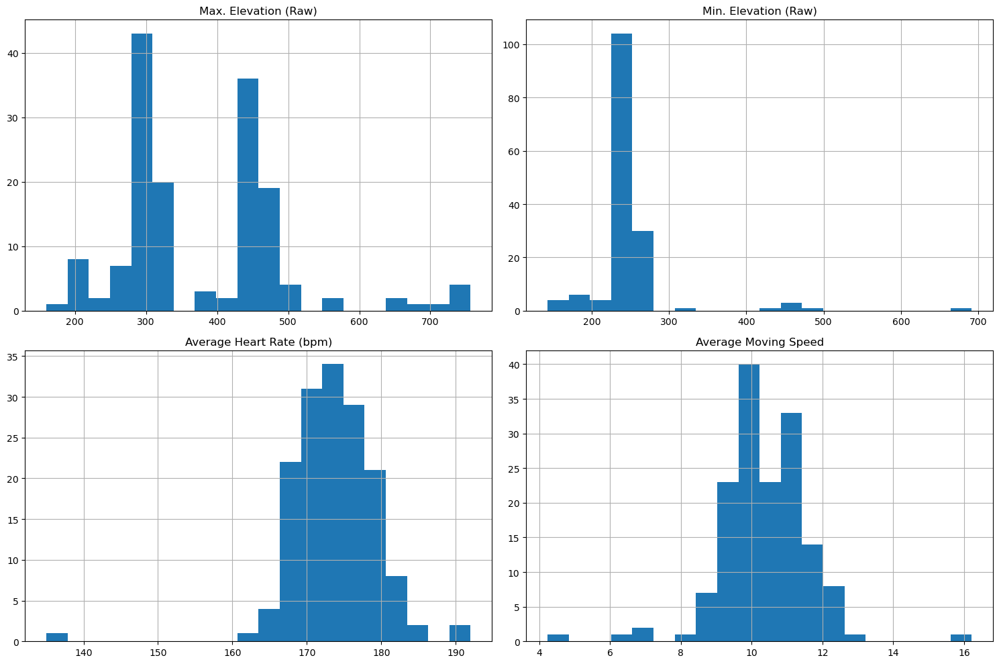

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histograms for some key columns
df_cleaned[['Max. Elevation (Raw)', 'Min. Elevation (Raw)', 'Average Heart Rate (bpm)', 'Average Moving Speed']].hist(bins=20, figsize=(15, 10))
plt.tight_layout()
plt.show()


#### Boxplots for Identifying Outliers.

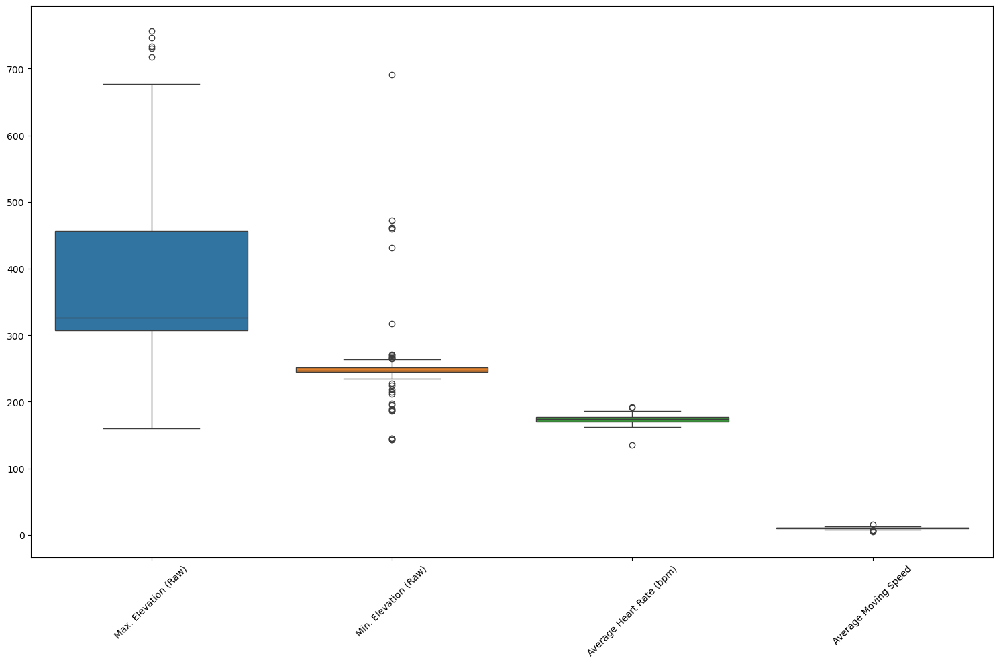

In [14]:
# Plot boxplots for key columns
plt.figure(figsize=(15, 10))
sns.boxplot(data=df_cleaned[['Max. Elevation (Raw)', 'Min. Elevation (Raw)', 'Average Heart Rate (bpm)', 'Average Moving Speed']])
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Correlation Analysis 

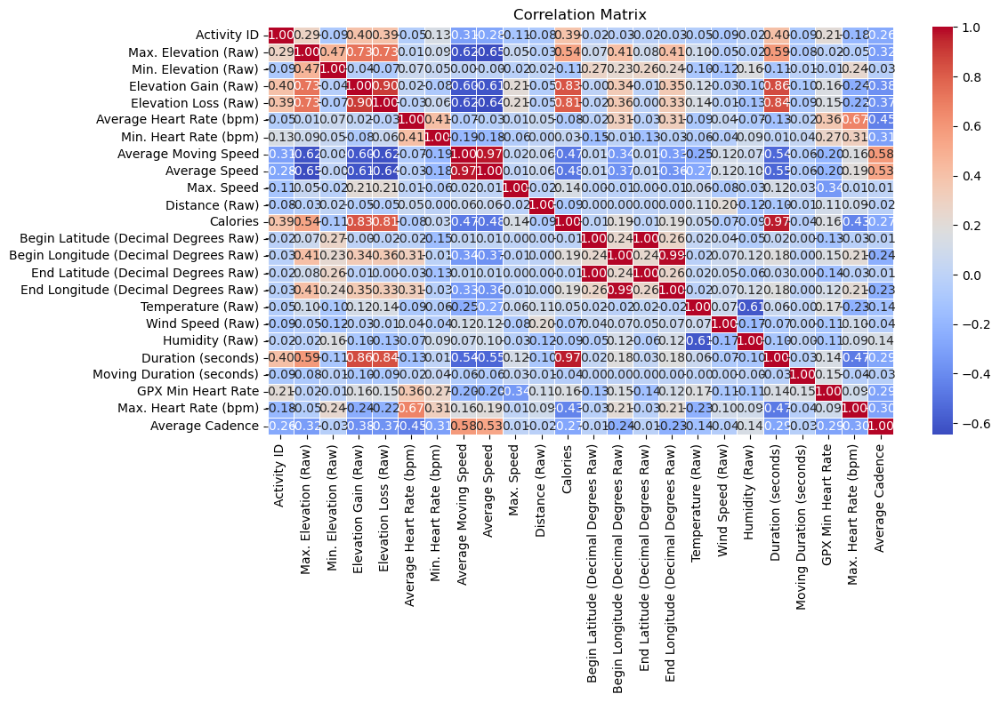

In [15]:
# Select only numeric columns for the correlation matrix
numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix
corr_matrix = numeric_cols.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()


#### Time-Based Analysis

* In this step, we’ll visualize how some variables change over time using the Begin Timestamp.

* Let’s plot how Average Heart Rate changes over time:

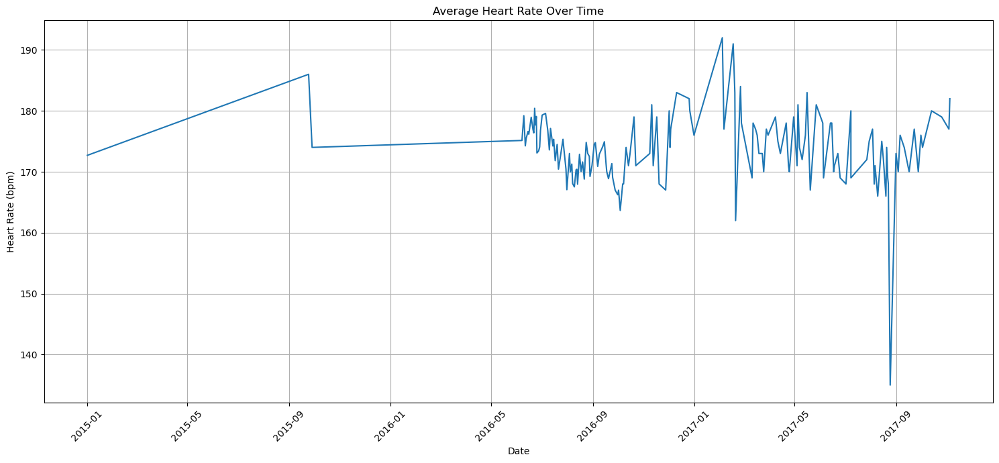

In [16]:
# Ensure the timestamp is in datetime format
df_cleaned['Begin Timestamp'] = pd.to_datetime(df_cleaned['Begin Timestamp'])

# Plot Average Heart Rate over time
plt.figure(figsize=(15, 7))
sns.lineplot(x=df_cleaned['Begin Timestamp'], y=df_cleaned['Average Heart Rate (bpm)'])
plt.title("Average Heart Rate Over Time")
plt.xlabel("Date")
plt.ylabel("Heart Rate (bpm)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


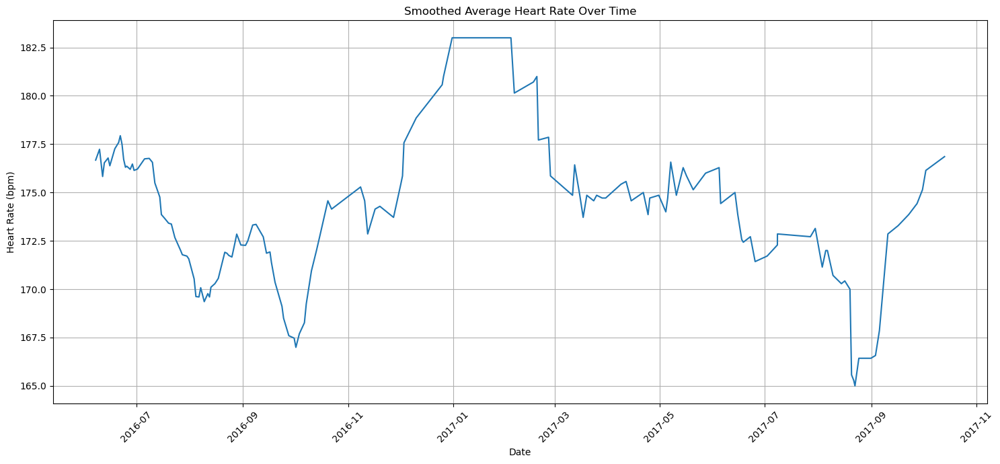

In [17]:
# Applying a rolling average for smoothing
df_cleaned['Smoothed Heart Rate'] = df_cleaned['Average Heart Rate (bpm)'].rolling(window=7, center=True).mean()

# Plot smoothed heart rate over time
plt.figure(figsize=(15, 7))
sns.lineplot(x=df_cleaned['Begin Timestamp'], y=df_cleaned['Smoothed Heart Rate'])
plt.title("Smoothed Average Heart Rate Over Time")
plt.xlabel("Date")
plt.ylabel("Heart Rate (bpm)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


## Route Mapping Implementation 

* Here I am going to use plotly for visualization. Plotly offers extensive capabilities for creating dynamic visualizations, including geographic maps with layers of data. I will create a map visualization using Plotly, specifically focusing on plotting routes with additional data overlays like heart rate or elevation.

In [18]:
pip install plotly


Note: you may need to restart the kernel to use updated packages.


* First, let's print the column names of DataFrame to see what columns are actually present. This will help us identify if there's a typo or case sensitivity issue.

In [20]:
# Print all column names in the DataFrame
print(df_cleaned.columns)


Index(['Activity ID', 'Activity Type', 'Begin Timestamp', 'End Timestamp',
       'Max. Elevation (Raw)', 'Min. Elevation (Raw)', 'Elevation Gain (Raw)',
       'Elevation Loss (Raw)', 'Average Heart Rate (bpm)',
       'Min. Heart Rate (bpm)', 'Average Moving Speed', 'Average Speed',
       'Max. Speed', 'Distance (Raw)', 'Duration (h:m:s)',
       'Moving Duration (h:m:s)', 'Calories', 'Device',
       'Begin Latitude (Decimal Degrees Raw)',
       'Begin Longitude (Decimal Degrees Raw)',
       'End Latitude (Decimal Degrees Raw)',
       'End Longitude (Decimal Degrees Raw)', 'Temperature (Raw)',
       'Wind Speed (Raw)', 'Wind Direction', 'Humidity (Raw)', 'Condition',
       'Rainfall', 'Duration (seconds)', 'Moving Duration (seconds)',
       'GPX Min Heart Rate', 'Max. Heart Rate (bpm)', 'Average Cadence',
       'Smoothed Heart Rate'],
      dtype='object')


* Convert Coordinates to Numeric: This step ensures that the latitude and longitude data are in a numeric format that Plotly can use for plotting.



In [21]:
import pandas as pd
import plotly.express as px

# Convert latitude and longitude to numeric
df_cleaned['Begin Latitude (Decimal Degrees Raw)'] = pd.to_numeric(df_cleaned['Begin Latitude (Decimal Degrees Raw)'], errors='coerce')
df_cleaned['Begin Longitude (Decimal Degrees Raw)'] = pd.to_numeric(df_cleaned['Begin Longitude (Decimal Degrees Raw)'], errors='coerce')


* Creating a Route Map: I will use  Plotly Express to plot the route. I want to color the route based on 'Smoothed Heart Rate'


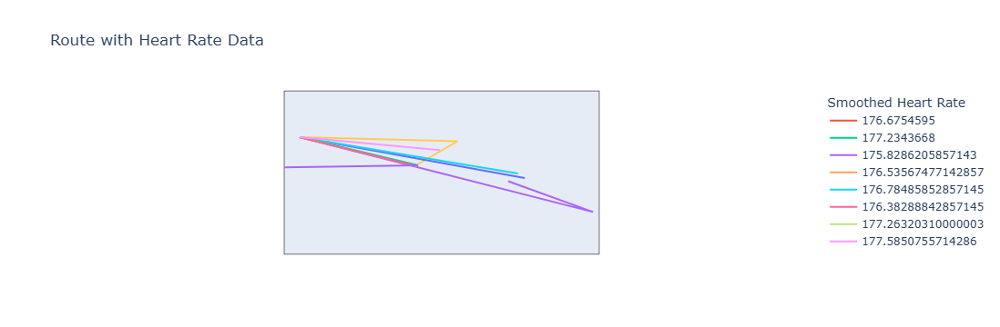

In [22]:
# Filter the DataFrame for plotting if necessary or use the whole DataFrame
route_df = df_cleaned  # Optionally filter by an activity or condition

fig = px.line_geo(route_df,
                  lat='Begin Latitude (Decimal Degrees Raw)',
                  lon='Begin Longitude (Decimal Degrees Raw)',
                  color='Smoothed Heart Rate',  # Assumes this column is ready
                  projection="natural earth",
                  title='Route with Heart Rate Data')

fig.update_geos(fitbounds="locations")  # Auto-adjusts the map to fit your routes
fig.show()


In [24]:
print("Latitude range:", df_cleaned['Begin Latitude (Decimal Degrees Raw)'].min(), "-", df_cleaned['Begin Latitude (Decimal Degrees Raw)'].max())
print("Longitude range:", df_cleaned['Begin Longitude (Decimal Degrees Raw)'].min(), "-", df_cleaned['Begin Longitude (Decimal Degrees Raw)'].max())


Latitude range: 48.00809657 - 48.2618436
Longitude range: 7.534499969 - 7.984674638


The output shows we have successfully created a route visualization using Plotly, but it seems to be displaying only a very limited section of the route or the visualization might not be zoomed appropriately to show the full path of the route.
To Improve the Map Visualization: Checking Data Extents

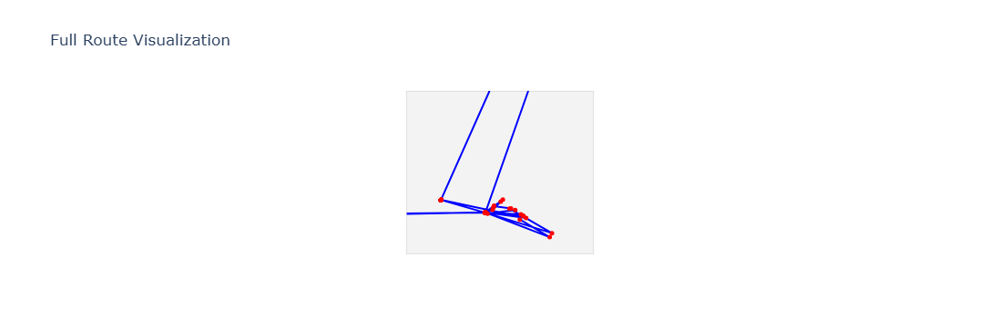

In [25]:
import plotly.graph_objects as go

# Create a scatter geo plot for the route
fig = go.Figure(go.Scattergeo(
    lon = df_cleaned['Begin Longitude (Decimal Degrees Raw)'],
    lat = df_cleaned['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'lines+markers',  # Display both lines and markers
    marker = dict(size = 5, color = 'red'),  # Red markers for points
    line = dict(width = 2, color = 'blue')  # Blue line for the route
))

# Update the layout to focus on your specific geographic area
fig.update_layout(
    title = 'Full Route Visualization',
    geo = dict(
        scope = 'europe',  # Focus on Europe since your coordinates fit this region
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
        lonaxis_range=[7.53, 7.99],  # Min and max longitude based on your data
        lataxis_range=[48.0, 48.27],  # Min and max latitude based on your data
    )
)

# Show the figure
fig.show()


Checking data ordering

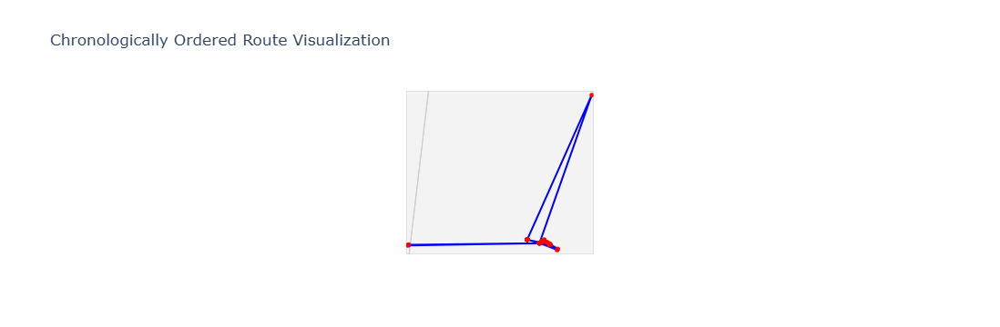

In [26]:
# Sort your data by 'Begin Timestamp' or another logical sequence
df_cleaned = df_cleaned.sort_values('Begin Timestamp')

# Then plot again using the sorted DataFrame
fig = go.Figure(go.Scattergeo(
    lon = df_cleaned['Begin Longitude (Decimal Degrees Raw)'],
    lat = df_cleaned['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'lines+markers',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 2, color = 'blue')
))

fig.update_layout(
    title = 'Chronologically Ordered Route Visualization',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
        lonaxis_range=[7.53, 7.99],
        lataxis_range=[48.0, 48.27],
    )
)

fig.show()


In [28]:
# Print the first few and last few latitude and longitude points to inspect their order and values
print(df_cleaned[['Begin Latitude (Decimal Degrees Raw)', 'Begin Longitude (Decimal Degrees Raw)']].head())
print(df_cleaned[['Begin Latitude (Decimal Degrees Raw)', 'Begin Longitude (Decimal Degrees Raw)']].tail())


   Begin Latitude (Decimal Degrees Raw)  Begin Longitude (Decimal Degrees Raw)
0                             48.024921                               7.826712
1                             48.024921                               7.826712
2                             48.024921                               7.826712
3                             48.024921                               7.826712
4                             48.024921                               7.826712
     Begin Latitude (Decimal Degrees Raw)  \
150                             48.019116   
151                             48.019194   
152                             48.018396   
153                             48.017859   
154                             48.019178   

     Begin Longitude (Decimal Degrees Raw)  
150                               7.857145  
151                               7.856334  
152                               7.880602  
153                               7.881881  
154                           

In [29]:
import numpy as np

# Calculate differences between successive points
df_cleaned['Lat_diff'] = df_cleaned['Begin Latitude (Decimal Degrees Raw)'].diff().abs()
df_cleaned['Lon_diff'] = df_cleaned['Begin Longitude (Decimal Degrees Raw)'].diff().abs()

# Filter points where changes are too large (thresholds to be adjusted based on typical data characteristics)
threshold_lat = 0.005  # example threshold for latitude changes
threshold_lon = 0.005  # example threshold for longitude changes

filtered_df = df_cleaned[(df_cleaned['Lat_diff'] < threshold_lat) & (df_cleaned['Lon_diff'] < threshold_lon)]

# Optionally, reset index if needed
filtered_df.reset_index(drop=True, inplace=True)


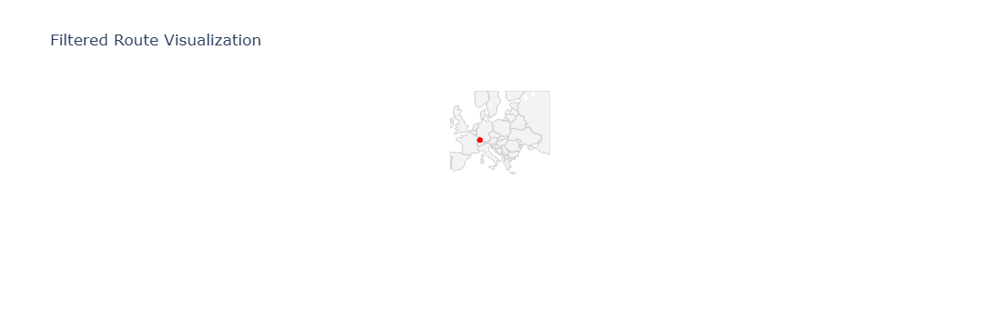

In [30]:
import plotly.graph_objects as go

fig = go.Figure(go.Scattergeo(
    lon = filtered_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = filtered_df['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Filtered Route Visualization',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)'
    )
)

fig.show()


#### Adjust Filtering Thresholds
It might be helpful to adjust the filtering thresholds to include a broader range of data points, or to examine the data more closely to determine a more appropriate threshold.

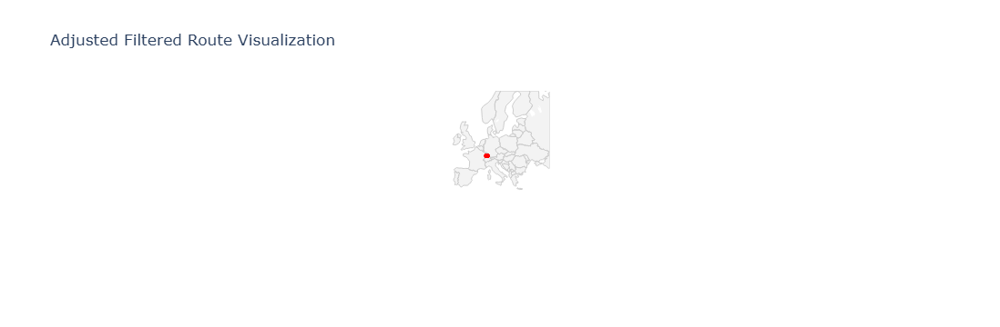

In [31]:
# Adjust these thresholds based on a closer inspection of the data
threshold_lat = 0.01  # Increase if too many points are being excluded
threshold_lon = 0.01  # Increase if too many points are being excluded

filtered_df = df_cleaned[(df_cleaned['Lat_diff'] < threshold_lat) & (df_cleaned['Lon_diff'] < threshold_lon)]

fig = go.Figure(go.Scattergeo(
    lon = filtered_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = filtered_df['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Adjusted Filtered Route Visualization',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)'
    )
)

fig.show()


#### Visualize Distribution of Points
To better understand how the points are distributed geographically and where the filters are cutting off, visualize the distribution of the latitude and longitude differences.

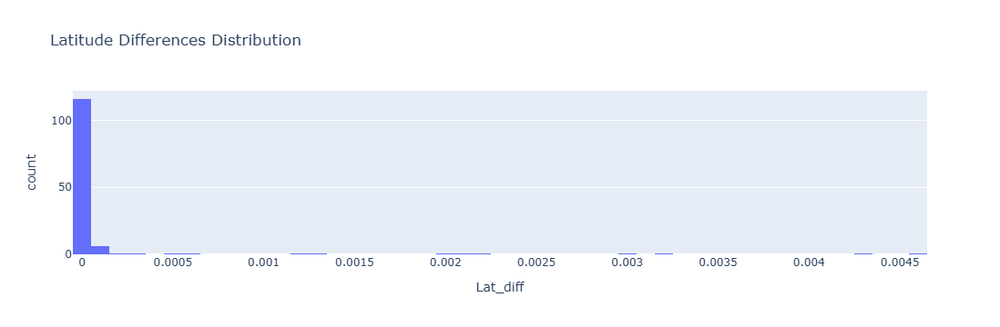

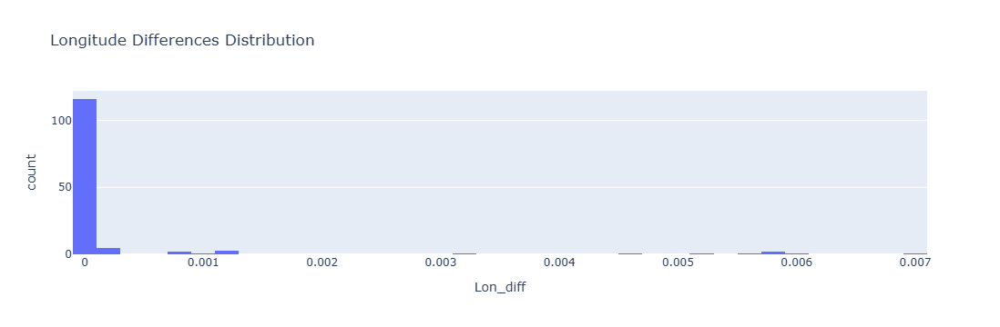

In [32]:
import plotly.express as px

# Histogram of latitude and longitude differences
fig = px.histogram(filtered_df, x='Lat_diff', nbins=50, title='Latitude Differences Distribution')
fig.show()
fig = px.histogram(filtered_df, x='Lon_diff', nbins=50, title='Longitude Differences Distribution')
fig.show()


* The histograms show that most of the latitude and longitude differences are very small, indicating minor movement or a highly localized dataset.

#### Manually Review Extreme Points
It may also be useful to manually review the points that are being filtered out to ensure they are true outliers and not just points at the start or end of a movement path.

In [33]:
# Display points considered outliers
outliers_df = df_cleaned[(df_cleaned['Lat_diff'] >= threshold_lat) | (df_cleaned['Lon_diff'] >= threshold_lon)]
print(outliers_df[['Begin Latitude (Decimal Degrees Raw)', 'Begin Longitude (Decimal Degrees Raw)', 'Lat_diff', 'Lon_diff']])


     Begin Latitude (Decimal Degrees Raw)  \
94                              48.019132   
97                              48.017627   
98                              48.019356   
99                              48.016733   
100                             48.024921   
122                             48.261844   
123                             48.019382   
124                             48.024096   
126                             48.021060   
128                             48.009915   
129                             48.019268   
132                             48.019115   
137                             48.016593   
142                             48.019268   
144                             48.020392   
146                             48.008097   
147                             48.019307   
152                             48.018396   
154                             48.019178   

     Begin Longitude (Decimal Degrees Raw)  Lat_diff  Lon_diff  
94                                

##### Loading the data 

In [2]:
import pandas as pd

# Load dataset
file_path = r"C:\Users\knive\OneDrive\Desktop\Sem 4\Capstone B\Fixed_cleaned_activities (1).csv"
df_cleaned = pd.read_csv(file_path)


##### Adding Difference Columns

In [3]:
# Calculating differences in latitude and longitude for filtering
df_cleaned['Lat_diff'] = df_cleaned['Begin Latitude (Decimal Degrees Raw)'].diff().abs()
df_cleaned['Lon_diff'] = df_cleaned['Begin Longitude (Decimal Degrees Raw)'].diff().abs()


##### Filter Out Extreme Changes

In [4]:
# Set thresholds for filtering
threshold_lat = 0.005  # Adjust based on your analysis
threshold_lon = 0.02   # Adjust based on your analysis

# Filter to remove large jumps
refined_df = df_cleaned[(df_cleaned['Lat_diff'] < threshold_lat) & (df_cleaned['Lon_diff'] < threshold_lon)]


##### Plot the Refined Data

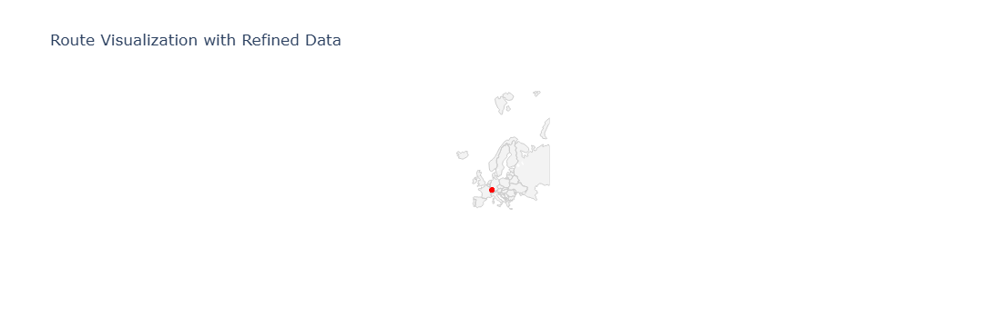

In [5]:
import plotly.graph_objects as go

# Plotting the refined data
fig = go.Figure(go.Scattergeo(
    lon = refined_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = refined_df['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Route Visualization with Refined Data',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)'
    )
)

fig.show()


* The visualization of refined data, appears to still focus on a very narrow area or a single point. This might indicate that the thresholds set for filtering are too restrictive, or that the majority of data points are clustered too closely with little variance.

##### Adjusting Filtered Thresholds

In [ ]:
# Increase thresholds for filtering
threshold_lat = 0.01  # Loosen the latitude change threshold
threshold_lon = 0.03  # Loosen the longitude change threshold

# Reapply filter to include more points
refined_df = df_cleaned[(df_cleaned['Lat_diff'] < threshold_lat) & (df_cleaned['Lon_diff'] < threshold_lon)]


##### Checking for data variance 

In [6]:
# Checking the geographical spread of the filtered data
print("Latitude range:", refined_df['Begin Latitude (Decimal Degrees Raw)'].min(), "-", refined_df['Begin Latitude (Decimal Degrees Raw)'].max())
print("Longitude range:", refined_df['Begin Longitude (Decimal Degrees Raw)'].min(), "-", refined_df['Begin Longitude (Decimal Degrees Raw)'].max())


Latitude range: 48.01525472 - 48.0250794
Longitude range: 7.534499969 - 7.881881241


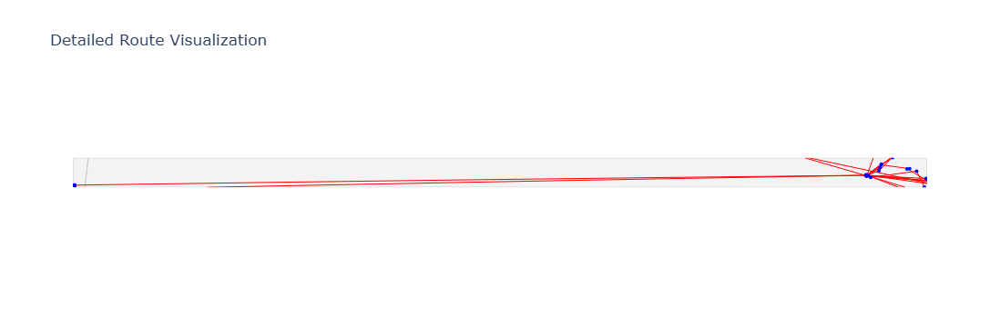

In [7]:
import plotly.graph_objects as go

# Plotting the data with a focus on the narrow geographic area
fig = go.Figure(go.Scattergeo(
    lon = df_cleaned['Begin Longitude (Decimal Degrees Raw)'],
    lat = df_cleaned['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'markers+lines',
    marker = dict(size = 4, color = 'blue'),
    line = dict(width = 1, color = 'red')
))

fig.update_layout(
    title = 'Detailed Route Visualization',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
        center=dict(lat=48.020, lon=7.708),  # Centering map around the average latitude and longitude
        lataxis_range=[48.015, 48.025],  # Narrow latitude range
        lonaxis_range=[7.534, 7.882]     # Narrow longitude range
    )
)

fig.show()


The updated visualization now provides a clearer view of the route, showing distinct points and the paths between them, albeit the display is quite elongated due to the specific latitude and longitude ranges. This elongation suggests the distribution of longitude values is broader compared to latitude, which can make the map appear stretched horizontally.


 ##### Adjust Aspect Ratio of the Map

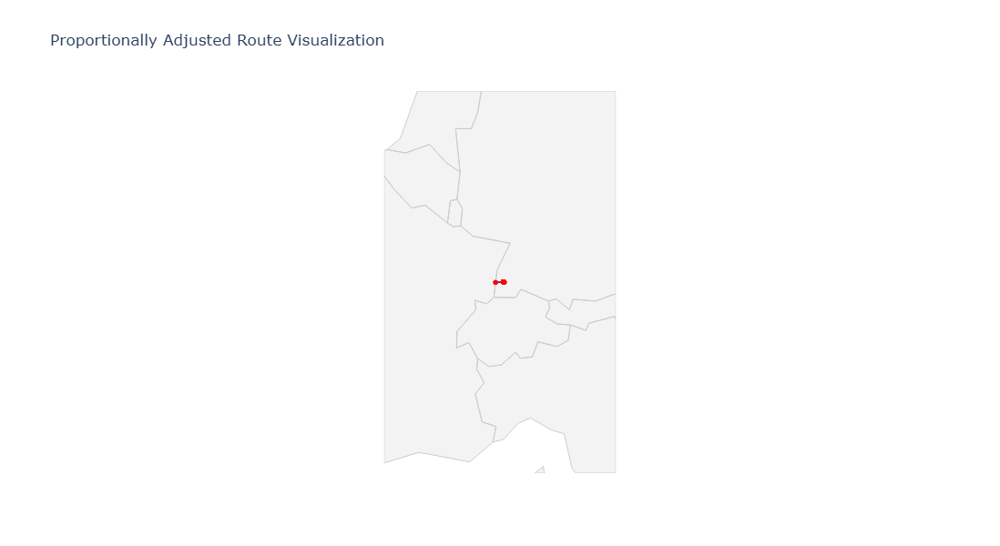

In [10]:
import plotly.graph_objects as go

# Creating the figure with adjusted dimensions
fig = go.Figure(go.Scattergeo(
    lon = refined_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = refined_df['Begin Latitude (Decimal Degrees Raw)'],
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Proportionally Adjusted Route Visualization',
    width=800,  # Adjust width as necessary
    height=600,  # Adjust height to manage aspect ratio
    geo=dict(
        scope='europe',
        projection_type='mercator',
        showland=True,
        landcolor='rgb(243, 243, 243)',
        countrycolor='rgb(204, 204, 204)',
        center=dict(lat=48.020, lon=7.708),  # Centering the map
        projection_scale=10  # Adjust this scale to zoom in or out
    ),
    autosize=False  # Disable autosizing to use provided width and height
)

fig.show()


The updated visualization now shows a more proportionally accurate map, highlighting the specific points where activities occurred. The map focuses well on the specific area of interest, displaying the data points clearly within the geographical context. This improved visual representation helps in understanding the spatial distribution of the activities recorded in the dataset.

In [11]:
fig = go.Figure(go.Scattergeo(
    lon = refined_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = refined_df['Begin Latitude (Decimal Degrees Raw)'],
    text = refined_df['Heart Rate (bpm)'],  # Example: Adding heart rate as hover text
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Detailed Route Visualization with Heart Rate Data',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
        center=dict(lat=48.020, lon=7.708),
        projection_scale=10
    )
)

fig.show()


KeyError: 'Heart Rate (bpm)'

In [12]:
print(df_cleaned.columns)


Index(['Activity ID', 'Activity Type', 'Begin Timestamp', 'End Timestamp',
       'Max. Elevation (Raw)', 'Min. Elevation (Raw)', 'Elevation Gain (Raw)',
       'Elevation Loss (Raw)', 'Average Heart Rate (bpm)',
       'Min. Heart Rate (bpm)', 'Average Moving Speed', 'Average Speed',
       'Max. Speed', 'Distance (Raw)', 'Duration (h:m:s)',
       'Moving Duration (h:m:s)', 'Calories', 'Device',
       'Begin Latitude (Decimal Degrees Raw)',
       'Begin Longitude (Decimal Degrees Raw)',
       'End Latitude (Decimal Degrees Raw)',
       'End Longitude (Decimal Degrees Raw)', 'Temperature (Raw)',
       'Wind Speed (Raw)', 'Wind Direction', 'Humidity (Raw)', 'Condition',
       'Rainfall', 'Duration (seconds)', 'Moving Duration (seconds)',
       'GPX Min Heart Rate', 'Max. Heart Rate (bpm)', 'Average Cadence',
       'Lat_diff', 'Lon_diff'],
      dtype='object')


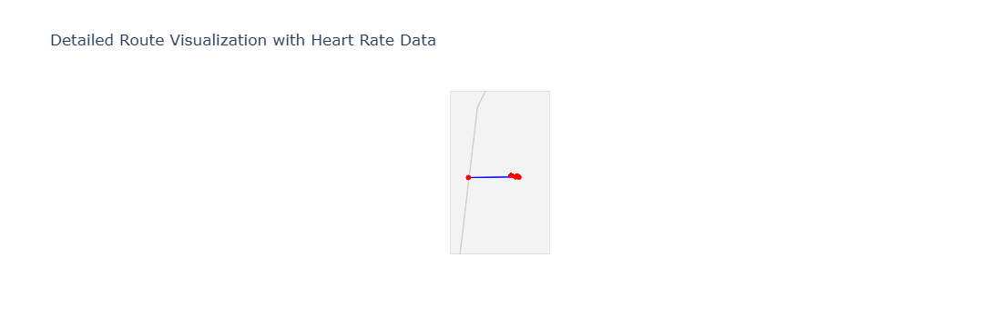

In [13]:
import plotly.graph_objects as go

# Creating the figure with adjusted dimensions
fig = go.Figure(go.Scattergeo(
    lon = refined_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = refined_df['Begin Latitude (Decimal Degrees Raw)'],
    text = refined_df['Average Heart Rate (bpm)'],  # Using the correct column name for heart rate
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Detailed Route Visualization with Heart Rate Data',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
        center = dict(lat=48.020, lon=7.708),  # Centering the map around the average coordinates
        projection_scale=10  # Adjusting scale to zoom in or out
    )
)

fig.show()


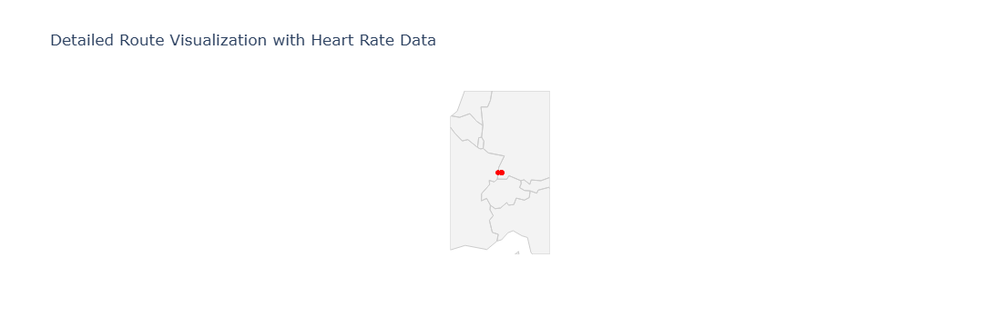

In [14]:
import plotly.graph_objects as go

# Creating the figure with adjusted dimensions
fig = go.Figure(go.Scattergeo(
    lon = refined_df['Begin Longitude (Decimal Degrees Raw)'],
    lat = refined_df['Begin Latitude (Decimal Degrees Raw)'],
    text = refined_df['Average Heart Rate (bpm)'],  # Heart rate data added here
    mode = 'markers+lines',
    marker = dict(size = 5, color = 'red'),
    line = dict(width = 1, color = 'blue')
))

fig.update_layout(
    title = 'Detailed Route Visualization with Heart Rate Data',
    geo = dict(
        scope = 'europe',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
        center = dict(lat=48.020, lon=7.708),  # Centering the map around the average coordinates
        projection_scale=10  # Adjusting scale to zoom in or out
    )
)

fig.show()


In [5]:
import pandas as pd

# Load the dataset
file_path = r"C:\Users\knive\OneDrive\Desktop\Sem 4\Capstone B\Fixed_cleaned_activities (1).csv"
df_cleaned = pd.read_csv(file_path)

# Calculate lat/lon differences to detect GPS jumps
df_cleaned['Lat_diff'] = df_cleaned['Begin Latitude (Decimal Degrees Raw)'].diff().abs()
df_cleaned['Lon_diff'] = df_cleaned['Begin Longitude (Decimal Degrees Raw)'].diff().abs()

# Remove points with large coordinate jumps
refined_df = df_cleaned[(df_cleaned['Lat_diff'] < 0.01) & (df_cleaned['Lon_diff'] < 0.02)].reset_index(drop=True)


# Color Code Paths 

color-coding the route based on speed using the Average Moving Speed column with a gradient color scale in Plotly.

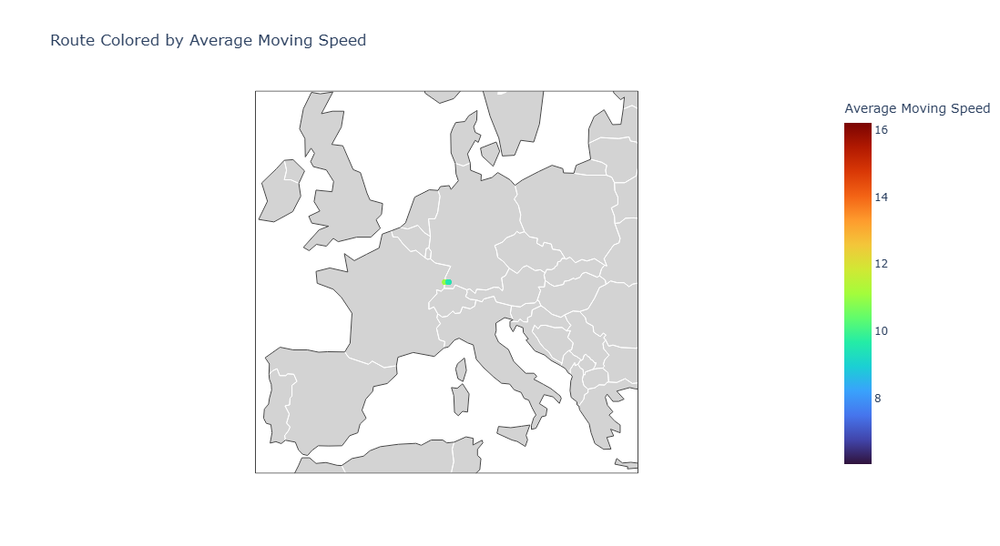

In [6]:
import plotly.express as px

fig = px.scatter_geo(
    refined_df,
    lat='Begin Latitude (Decimal Degrees Raw)',
    lon='Begin Longitude (Decimal Degrees Raw)',
    color='Average Moving Speed',
    hover_name='Average Heart Rate (bpm)',
    color_continuous_scale='Turbo',
    title='Route Colored by Average Moving Speed',
    projection='mercator'
)

fig.update_geos(
    showland=True, landcolor='LightGray',
    showcountries=True, countrycolor='white',
    center=dict(lat=48.020, lon=7.708),
    projection_scale=10
)

fig.update_layout(height=600)
fig.show()



The output shows different colors along the route corresponding to different speed values — this visually highlights performance variations.

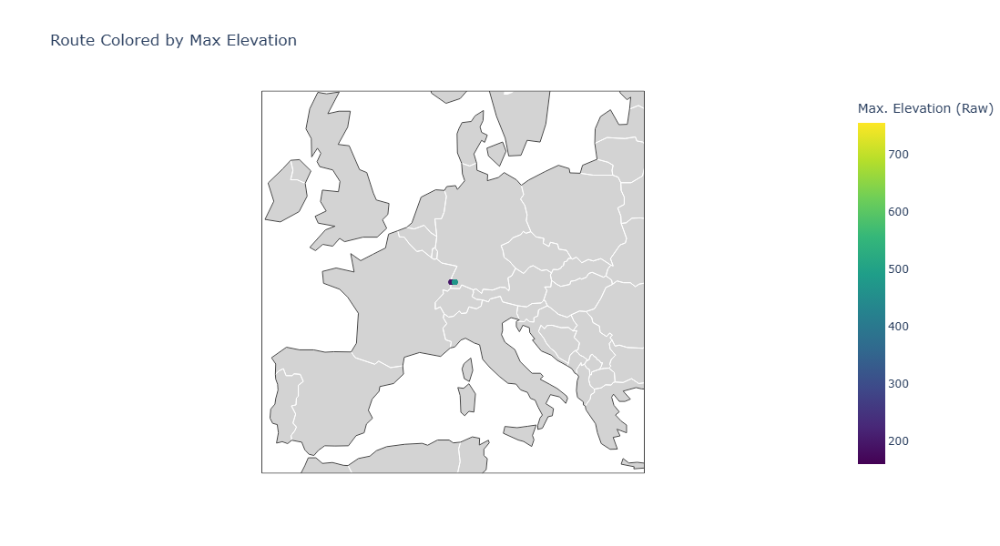

In [8]:
import pandas as pd
import plotly.express as px

# Load dataset (only if not already loaded)
file_path = r"C:\Users\knive\OneDrive\Desktop\Sem 4\Capstone B\Fixed_cleaned_activities (1).csv"
df_cleaned = pd.read_csv(file_path)

# Filter to create refined_df by removing large GPS jumps
df_cleaned['Lat_diff'] = df_cleaned['Begin Latitude (Decimal Degrees Raw)'].diff().abs()
df_cleaned['Lon_diff'] = df_cleaned['Begin Longitude (Decimal Degrees Raw)'].diff().abs()
refined_df = df_cleaned[(df_cleaned['Lat_diff'] < 0.01) & (df_cleaned['Lon_diff'] < 0.02)].reset_index(drop=True)

# Plot: Color by Max. Elevation (Raw)
fig = px.scatter_geo(
    refined_df,
    lat='Begin Latitude (Decimal Degrees Raw)',
    lon='Begin Longitude (Decimal Degrees Raw)',
    color='Max. Elevation (Raw)',  # Elevation coloring here
    hover_name='Average Heart Rate (bpm)',  # Optional info on hover
    color_continuous_scale='Viridis',
    title='Route Colored by Max Elevation',
    projection='mercator'
)

fig.update_geos(
    showland=True, landcolor='LightGray',
    showcountries=True, countrycolor='white',
    center=dict(lat=48.020, lon=7.708),
    projection_scale=10
)

fig.update_layout(height=600)
fig.show()


####  Route Visualization Colored by Elevation

This map visualizes the running route using GPS coordinates, with each point color-coded based on the **Max Elevation (Raw)** value.

- The color scale (Viridis) represents elevation changes along the route.
- Lower elevation points appear in darker shades (purple), while higher elevations appear in brighter shades (yellow/green).
- This helps visually identify terrain variation and understand how elevation changes across different segments of the route.

 This step enhances the route visualization by adding terrain context, which can later be correlated with heart rate or speed for performance analysis.


#### Color-Coded Lines by Speed (One Segment at a Time)



C:\Users\knive\AppData\Local\Temp\ipykernel_16456\935244122.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



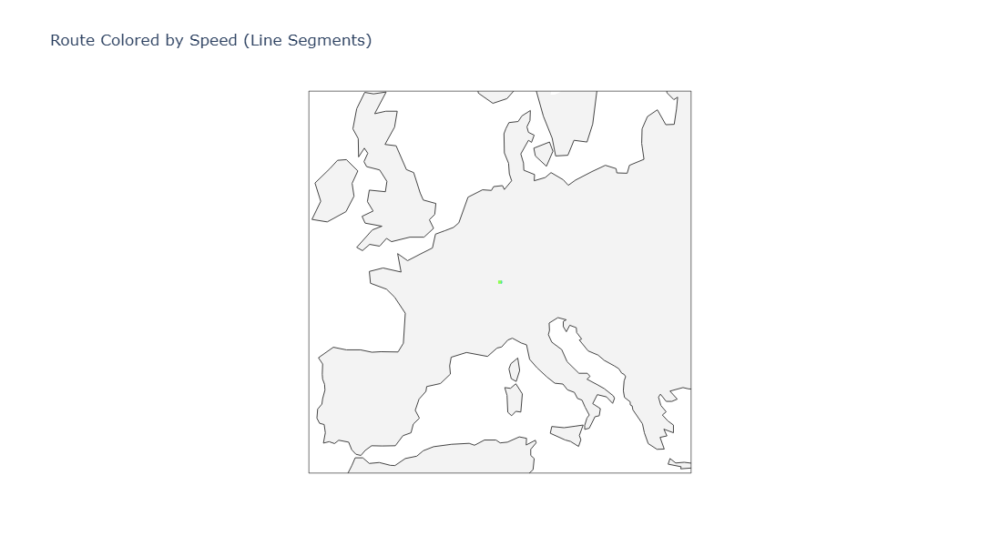

In [13]:
import plotly.graph_objects as go
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Normalize speed values for coloring
norm = mcolors.Normalize(vmin=refined_df['Average Moving Speed'].min(), vmax=refined_df['Average Moving Speed'].max())
cmap = cm.get_cmap('turbo')  # Choose color scale (same as 'Turbo' in Plotly)

segments = []

for i in range(len(refined_df) - 1):
    lat_start = refined_df.iloc[i]['Begin Latitude (Decimal Degrees Raw)']
    lon_start = refined_df.iloc[i]['Begin Longitude (Decimal Degrees Raw)']
    lat_end = refined_df.iloc[i+1]['Begin Latitude (Decimal Degrees Raw)']
    lon_end = refined_df.iloc[i+1]['Begin Longitude (Decimal Degrees Raw)']
    speed = refined_df.iloc[i]['Average Moving Speed']
    
    # Map speed to RGBA color
    rgba = cmap(norm(speed))
    hex_color = mcolors.to_hex(rgba)

    segments.append(
        go.Scattergeo(
            lat=[lat_start, lat_end],
            lon=[lon_start, lon_end],
            mode='lines',
            line=dict(width=3, color=hex_color),
            hoverinfo='none',
            showlegend=False
        )
    )

# Plot all line segments
fig = go.Figure(data=segments)

fig.update_layout(
    title='Route Colored by Speed (Line Segments)',
    geo=dict(
        projection_type='mercator',
        showland=True,
        landcolor='rgb(243, 243, 243)',
        countrycolor='rgb(204, 204, 204)',
        center=dict(lat=48.020, lon=7.708),
        projection_scale=10
    ),
    height=600
)

fig.show()


#### Color Route Segments by Elevation

C:\Users\knive\AppData\Local\Temp\ipykernel_16456\2721293731.py:7: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



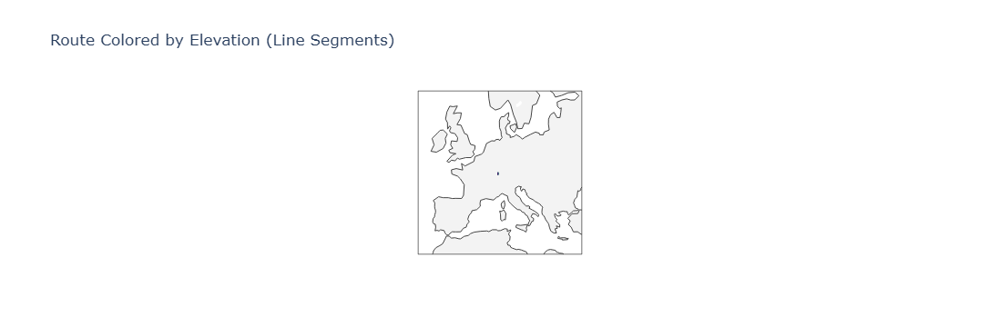

In [14]:
import plotly.graph_objects as go
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Normalize elevation values
norm = mcolors.Normalize(vmin=refined_df['Max. Elevation (Raw)'].min(), vmax=refined_df['Max. Elevation (Raw)'].max())
cmap = cm.get_cmap('viridis')  # Use any colormap you like

segments = []

for i in range(len(refined_df) - 1):
    lat_start = refined_df.iloc[i]['Begin Latitude (Decimal Degrees Raw)']
    lon_start = refined_df.iloc[i]['Begin Longitude (Decimal Degrees Raw)']
    lat_end = refined_df.iloc[i+1]['Begin Latitude (Decimal Degrees Raw)']
    lon_end = refined_df.iloc[i+1]['Begin Longitude (Decimal Degrees Raw)']
    elevation = refined_df.iloc[i]['Max. Elevation (Raw)']

    # Convert elevation to color
    rgba = cmap(norm(elevation))
    hex_color = mcolors.to_hex(rgba)

    segments.append(
        go.Scattergeo(
            lat=[lat_start, lat_end],
            lon=[lon_start, lon_end],
            mode='lines',
            line=dict(width=3, color=hex_color),
            hoverinfo='none',
            showlegend=False
        )
    )

# Plot figure
fig = go.Figure(data=segments)

fig.update_layout(
    title='Route Colored by Elevation (Line Segments)',
    geo=dict(
        projection_type='mercator',
        showland=True,
        landcolor='rgb(243, 243, 243)',
        countrycolor='rgb(204, 204, 204)',
        center=dict(lat=48.020, lon=7.708),
        projection_scale=10
    ),
    height=600
)

fig.show()


# DATA ANALYSIS 

In [2]:
import pandas as pd

# Load the dataset
file_path = r"C:\Users\knive\OneDrive\Desktop\Sem 4\Capstone B\Fixed_cleaned_activities (1).csv"
df_cleaned = pd.read_csv(file_path)

# Filter to remove extreme GPS jumps
df_cleaned['Lat_diff'] = df_cleaned['Begin Latitude (Decimal Degrees Raw)'].diff().abs()
df_cleaned['Lon_diff'] = df_cleaned['Begin Longitude (Decimal Degrees Raw)'].diff().abs()

# Create refined_df
refined_df = df_cleaned[(df_cleaned['Lat_diff'] < 0.01) & (df_cleaned['Lon_diff'] < 0.02)].reset_index(drop=True)


### Speed Vs Elevation 

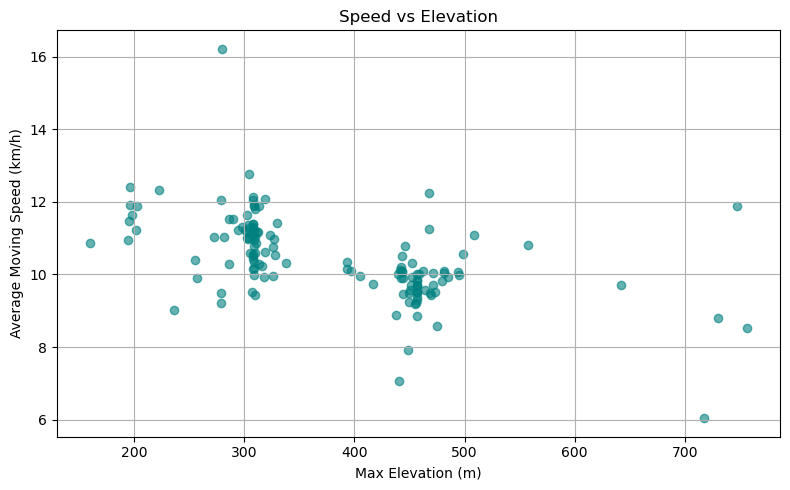

Correlation between Elevation and Speed: -0.553


In [3]:
import matplotlib.pyplot as plt

# Scatter plot: Speed vs Elevation
plt.figure(figsize=(8, 5))
plt.scatter(refined_df['Max. Elevation (Raw)'], refined_df['Average Moving Speed'], alpha=0.6, color='teal')
plt.title('Speed vs Elevation')
plt.xlabel('Max Elevation (m)')
plt.ylabel('Average Moving Speed (km/h)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Correlation
speed_elev_corr = refined_df['Max. Elevation (Raw)'].corr(refined_df['Average Moving Speed'])
print(f"Correlation between Elevation and Speed: {speed_elev_corr:.3f}")


Correlation coefficient: -0.553

This is a moderate negative correlation, meaning:

As elevation increases, average running speed tends to decrease.

This matches real-world expectations — runners naturally slow down on steeper inclines due to increased physical effort.

The scatter plot also shows some dense clusters of slower speeds at higher elevations, further reinforcing the pattern.

### Heart Rate vs Elevation


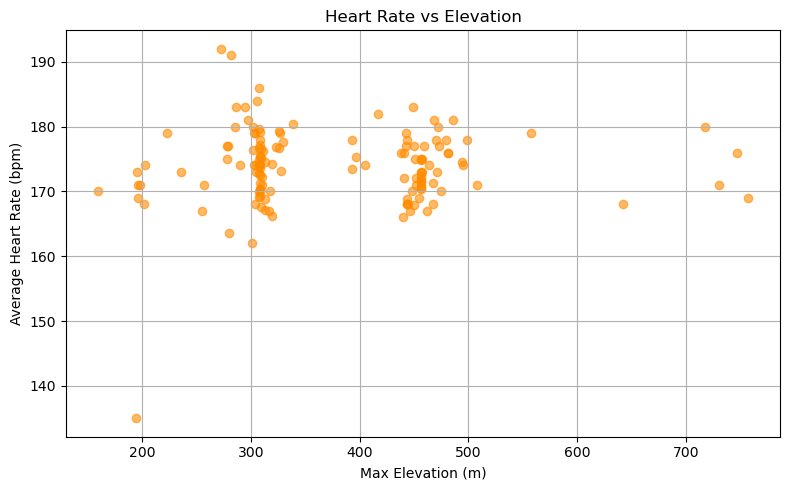

Correlation between Elevation and Heart Rate: 0.040


In [4]:
# Scatter plot: Heart Rate vs Elevation
plt.figure(figsize=(8, 5))
plt.scatter(refined_df['Max. Elevation (Raw)'], refined_df['Average Heart Rate (bpm)'], alpha=0.6, color='darkorange')
plt.title('Heart Rate vs Elevation')
plt.xlabel('Max Elevation (m)')
plt.ylabel('Average Heart Rate (bpm)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Correlation
hr_elev_corr = refined_df['Max. Elevation (Raw)'].corr(refined_df['Average Heart Rate (bpm)'])
print(f"Correlation between Elevation and Heart Rate: {hr_elev_corr:.3f}")


Correlation coefficient: +0.040

This indicates a very weak positive correlation between elevation and average heart rate.

That means: heart rate does not significantly increase with elevation in your dataset.

Possible reasons:

The runner may be well-conditioned.

Elevation gain is gradual and not sharp.

Other factors like pace or rest segments could affect heart rate more than terrain.

### Heart Rate vs Speed

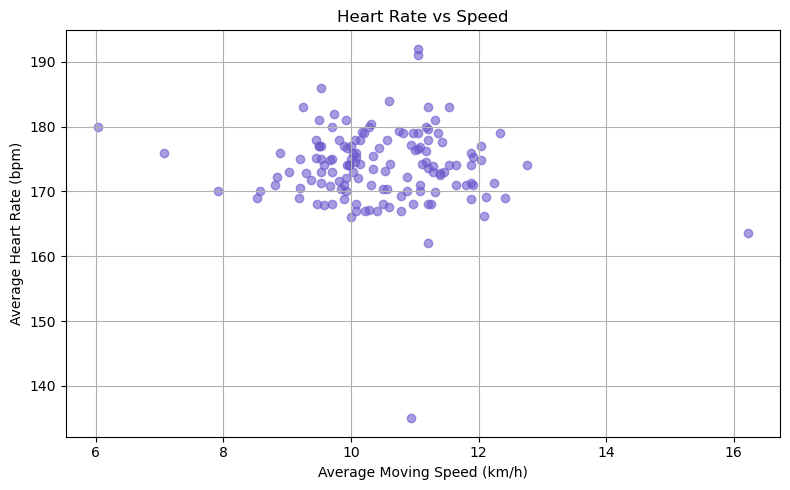

Correlation between Speed and Heart Rate: -0.098


In [5]:
# Scatter plot: Speed vs Heart Rate
plt.figure(figsize=(8, 5))
plt.scatter(refined_df['Average Moving Speed'], refined_df['Average Heart Rate (bpm)'], alpha=0.6, color='slateblue')
plt.title('Heart Rate vs Speed')
plt.xlabel('Average Moving Speed (km/h)')
plt.ylabel('Average Heart Rate (bpm)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Correlation
hr_speed_corr = refined_df['Average Moving Speed'].corr(refined_df['Average Heart Rate (bpm)'])
print(f"Correlation between Speed and Heart Rate: {hr_speed_corr:.3f}")
